In [1]:
import time
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.markers import MarkerStyle
from mplsoccer.pitch import Pitch
from mplsoccer import Pitch, VerticalPitch
from highlight_text import ax_text, fig_text
from collections import Counter
from matplotlib.colors import LinearSegmentedColormap

from highlight_text import ax_text
from PIL import Image
from mplsoccer import add_image
import matplotlib.ticker as ticker
import urllib
from urllib.request import urlopen

from sklearn.cluster import KMeans
import matplotlib.patches as patches

pd.set_option('display.max_columns', None)

In [2]:
df = pd.read_csv("D:\FData\Euro2024\Group_stage_all.csv")

# For

In [3]:
def plot_blank(ax):
    pitch = VerticalPitch(pitch_type='uefa', pitch_color='#f5f5f5', line_color='#f5f5f5', spot_type='square', linewidth=2, half=True, corner_arcs=True)
    pitch.draw(ax=ax)
    ax.set_ylim(52.35)
    ax.set_xlim(-0.5, 68.5)

In [ ]:
def plot_crosses(ax, teamName):
    pitch = VerticalPitch(pitch_type='uefa', line_color='black', pitch_color='#f5f5f5', corner_arcs=True, line_zorder=2,  linewidth=2, goal_type='box')
    pitch.draw(ax=ax)
    
    ax.set_ylim(52.15)
    ax.set_xlim(-0.35, 68.35)

    pearl_earring_cmap_left = LinearSegmentedColormap.from_list("Pearl Earring - 10 colors", ['#f5f5f5', '#ff4b44'], N=40)  
    pearl_earring_cmap_right = LinearSegmentedColormap.from_list("Pearl Earring - 10 colors", ['#f5f5f5', '#00a0de'], N=40) 
    
    df_cross = df[(df['teamName']==teamName) & (df['type']=='Pass') & 
                  (df['qualifiers'].str.contains('Cross')) & (~df['qualifiers'].str.contains('CornerTaken'))]
    df_kp = df_cross[df_cross['qualifiers'].str.contains('KeyPass')]
    df_as = df_cross[df_cross['qualifiers'].str.contains('IntentionalGoalAssist')]
    df_left = df_cross[df_cross['y']>34]
    df_right = df_cross[df_cross['y']<34]
    left_comp = df_left[df_left['outcomeType']=='Successful']
    right_comp = df_right[df_right['outcomeType']=='Successful']
    left_kp = df_left[df_left['qualifiers'].str.contains('KeyPass')]
    right_kp = df_right[df_right['qualifiers'].str.contains('KeyPass')]
    left_as = df_left[df_left['qualifiers'].str.contains('IntentionalGoalAssist')]
    right_as = df_right[df_right['qualifiers'].str.contains('IntentionalGoalAssist')]
    success_rate = round(((len(left_comp)+len(right_comp))/(len(df_cross))),4)*100
    # Compute bin statistics and mask zeros
    bin_statistic_left = pitch.bin_statistic(df_left.x, df_left.y, bins=(24, 20), statistic='count', normalize=True)
    bin_statistic_left['statistic'] = np.where(bin_statistic_left['statistic'] == 0, np.nan, bin_statistic_left['statistic'])

    bin_statistic_right = pitch.bin_statistic(df_right.x, df_right.y, bins=(24, 20), statistic='count', normalize=True)
    bin_statistic_right['statistic'] = np.where(bin_statistic_right['statistic'] == 0, np.nan, bin_statistic_right['statistic'])

    # Plot heatmaps
    pitch.heatmap(bin_statistic_left, ax=ax, cmap=pearl_earring_cmap_left, edgecolors='#f5f5f5', lw=0.72)
    pitch.heatmap(bin_statistic_right, ax=ax, cmap=pearl_earring_cmap_right, edgecolors='#f5f5f5', lw=0.72)
    
    # lines_all = pitch.lines(df_cross.x, df_cross.y, df_cross.endX, df_cross.endY, lw=3.5, transparent=True, comet=True, color='gray', ax=ax, alpha=0.1)
    for idx, row in df_kp.iterrows():
        if 'RightFoot' in row['qualifiers']:
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#e09302', zorder=2, mutation_scale=5, alpha=0.5, linewidth=1.5, connectionstyle='arc3,rad=0.18')
            ax.add_patch(arrow)
        if 'LeftFoot' in row['qualifiers']:
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#e09302', zorder=2, mutation_scale=5, alpha=0.5, linewidth=1.5, connectionstyle='arc3,rad=-0.18')
            ax.add_patch(arrow)
        if (('RightFoot' not in row['qualifiers']) & ('LeftFoot' not in row['qualifiers'])):
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#e09302', zorder=2, mutation_scale=5, alpha=0.5, linewidth=1.5)
            ax.add_patch(arrow)

    for idx, row in df_as.iterrows():
        if 'RightFoot' in row['qualifiers']:
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#69f900', zorder=2, mutation_scale=5, alpha=1, linewidth=2.5, connectionstyle='arc3,rad=0.18')
            ax.add_patch(arrow)
        if 'LeftFoot' in row['qualifiers']:
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#69f900', zorder=2, mutation_scale=5, alpha=1, linewidth=2.5, connectionstyle='arc3,rad=-0.18')
            ax.add_patch(arrow)
        if (('RightFoot' not in row['qualifiers']) & ('LeftFoot' not in row['qualifiers'])) :
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#69f900', zorder=2, mutation_scale=5, alpha=0.5, linewidth=1.5)
            ax.add_patch(arrow)
            
    # lines_kp = pitch.lines(df_kp.x, df_kp.y, df_kp.endX, df_kp.endY, lw=2.5, transparent=True, comet=True, color='#e09302', ax=ax, alpha=0.35)
    # lines_as = pitch.lines(df_as.x, df_as.y, df_as.endX, df_as.endY, lw=3.5, transparent=True, comet=True, color='#69f900', ax=ax, alpha=1, connectionstyle="arc3,rad=0.25")
    # sc1 = ax.scatter(df_cross.endY, df_cross.endX, s=20, color='gray', ec='black', lw=0.5, alpha=0.1, zorder=2)
    sc2 = ax.scatter(df_kp.endY, df_kp.endX, s=50, color='#e09302', ec='black', alpha=0.35, lw=1, zorder=2)
    sc3 = ax.scatter(df_as.endY, df_as.endX, s=70, color='#69f900', ec='black', alpha=0.75, lw=1, zorder=2)

    ax.text(68, 59, f"Crosses from Left \nTotal(comp.): {len(df_left)}({len(left_comp)})", color='#ff4b44', fontsize=15, va='center', ha='left', 
            bbox=dict(facecolor='#d9d9d9', edgecolor='None', boxstyle='round,pad=0.19'))
    ax.text(0, 59, f"Crosses from Right\n({len(right_comp)}){len(df_right)} :(comp.)Total", color='#00a0de', fontsize=15, va='center', ha='right',
           bbox=dict(facecolor='#d9d9d9', edgecolor='None', boxstyle='round,pad=0.19'))
    highlight_text = [{'color':'g'}, {'color':'g'}]
    ax_text(68, 55.5, f"Key Pass <(Assist)> : {len(left_kp)} <({len(left_as)})>", color='#e09302', fontsize=15, va='center', ha='left',
            bbox=dict(facecolor='#d9d9d9', edgecolor='None', boxstyle='round,pad=0.175'), highlight_textprops=highlight_text, ax=ax)
    ax_text(0, 55.5, f"<({len(right_as)})> {len(right_kp)} : <(Assist)> Key Pass", color='#e09302', fontsize=15, va='center', ha='right', 
            bbox=dict(facecolor='#d9d9d9', edgecolor='None', boxstyle='round,pad=0.175'), highlight_textprops=highlight_text, ax=ax)

    left_counts = df_left['shortName'].value_counts()
    max_player_left = left_counts.idxmax()
    max_count_left = left_counts.max()
    ax.text(68, 52, f"Most cross from left:\n{max_player_left} ({max_count_left})", color='#ff4b44', fontsize=15, va='center', ha='left',
           bbox=dict(facecolor='#d9d9d9', edgecolor='None', boxstyle='round,pad=0.19'))
    right_counts = df_right['shortName'].value_counts()
    max_player_right = right_counts.idxmax()
    max_count_right = right_counts.max()
    ax.text(0, 52, f"Most cross from right:\n({max_count_right}) {max_player_right}", color='#00a0de', fontsize=15, va='center', ha='right',
           bbox=dict(facecolor='#d9d9d9', edgecolor='None', boxstyle='round,pad=0.19'))
    
    ax.text(34, 113, f"{teamName}: {len(df_cross)} Crosses", color='black', fontsize=20, fontweight='bold', va='center', ha='center')
    ax.text(34, 110, f"success rate: {round(success_rate)}%", color='k', fontsize=12, alpha=0.5, va='center', ha='center')
    
    # Take data coordinates and transform them to normalized figure coordinates
    DC_to_FC = ax.transData.transform
    FC_to_NFC = fig.transFigure.inverted().transform
    DC_to_NFC = lambda x: FC_to_NFC(DC_to_FC(x))
    ax_coords = DC_to_NFC((0,107))
    ax_size = 0.05
    image_ax = fig.add_axes([ax_coords[0], ax_coords[1], ax_size, ax_size], fc='None', anchor='C')
    fotmob_url = f'https://raw.githubusercontent.com/adnaaan433/club_teams_logos/main/{teamName}.png'
    fotmob_url = fotmob_url.replace(' ', '%20')
    club_icon = Image.open(urllib.request.urlopen(fotmob_url))
    image_ax.imshow(club_icon)
    image_ax.axis('off')
    
    ax.invert_xaxis()
    
    return 

# Measure the execution time
start_time = time.time()
fig, ax = plt.subplots(facecolor='#f5f5f5', figsize=(10,10), dpi=222)
plot_crosses(ax, 'Portugal')
end_time = time.time()
execution_time = end_time - start_time
plt.show()
print(f"Execution Time: {execution_time} seconds")

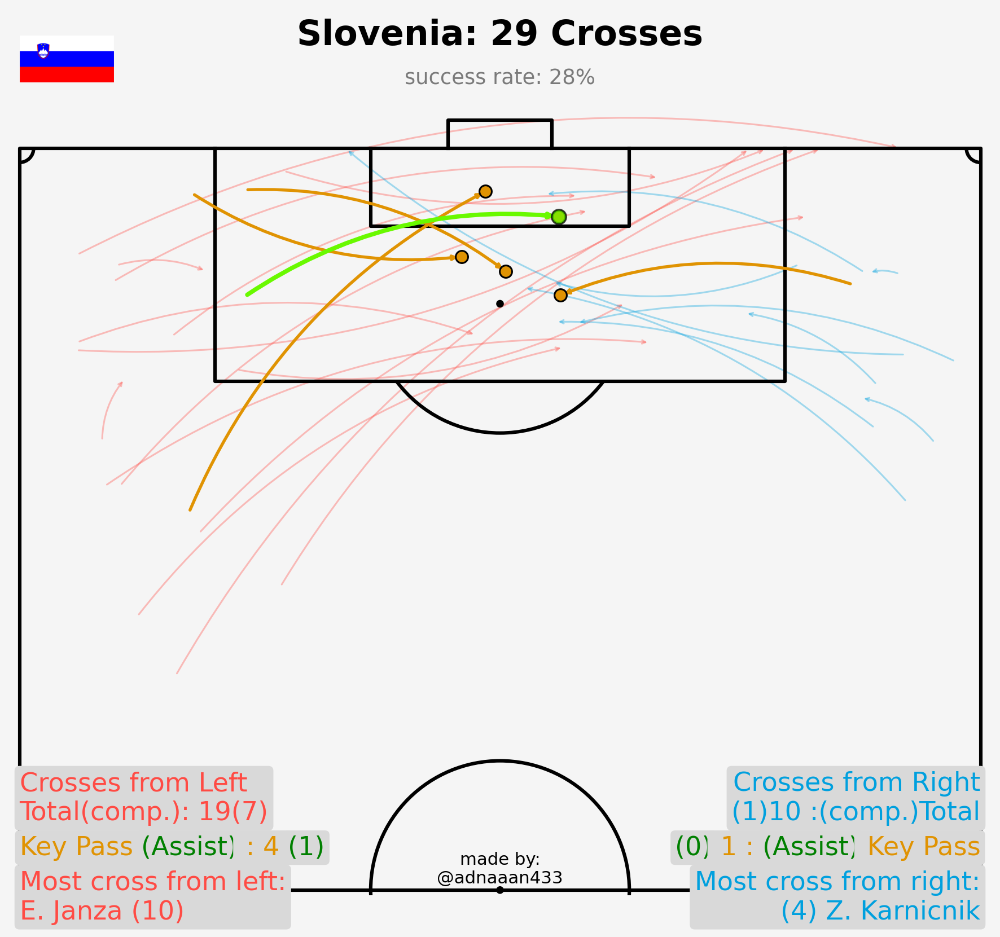

Execution Time: 0.8944437503814697 seconds


In [5]:
def plot_crosses(ax, teamName):
    pitch = VerticalPitch(pitch_type='uefa', line_color='black', pitch_color='#f5f5f5', corner_arcs=True, line_zorder=2,  linewidth=2, goal_type='box')
    pitch.draw(ax=ax)
    
    ax.set_ylim(52.15)
    ax.set_xlim(-0.35, 68.35)

    pearl_earring_cmap_left = LinearSegmentedColormap.from_list("Pearl Earring - 10 colors", ['#f5f5f5', '#ff4b44'], N=40)  
    pearl_earring_cmap_right = LinearSegmentedColormap.from_list("Pearl Earring - 10 colors", ['#f5f5f5', '#00a0de'], N=40) 
    
    df_cross = df[(df['teamName']==teamName) & (df['type']=='Pass') & 
                  (df['qualifiers'].str.contains('Cross')) & (~df['qualifiers'].str.contains('CornerTaken'))]
    df_kp = df_cross[df_cross['qualifiers'].str.contains('KeyPass')]
    df_as = df_cross[df_cross['qualifiers'].str.contains('IntentionalGoalAssist')]
    df_left = df_cross[df_cross['y']>34]
    df_right = df_cross[df_cross['y']<34]
    left_comp = df_left[df_left['outcomeType']=='Successful']
    right_comp = df_right[df_right['outcomeType']=='Successful']
    left_kp = df_left[df_left['qualifiers'].str.contains('KeyPass')]
    right_kp = df_right[df_right['qualifiers'].str.contains('KeyPass')]
    left_as = df_left[df_left['qualifiers'].str.contains('IntentionalGoalAssist')]
    right_as = df_right[df_right['qualifiers'].str.contains('IntentionalGoalAssist')]
    success_rate = round(((len(left_comp)+len(right_comp))/(len(df_cross))),4)*100
    # Compute bin statistics and mask zeros
    bin_statistic_left = pitch.bin_statistic(df_left.x, df_left.y, bins=(24, 20), statistic='count', normalize=True)
    bin_statistic_left['statistic'] = np.where(bin_statistic_left['statistic'] == 0, np.nan, bin_statistic_left['statistic'])

    bin_statistic_right = pitch.bin_statistic(df_right.x, df_right.y, bins=(24, 20), statistic='count', normalize=True)
    bin_statistic_right['statistic'] = np.where(bin_statistic_right['statistic'] == 0, np.nan, bin_statistic_right['statistic'])

    # # Plot heatmaps
    # pitch.heatmap(bin_statistic_left, ax=ax, cmap=pearl_earring_cmap_left, edgecolors='#f5f5f5', lw=0.72)
    # pitch.heatmap(bin_statistic_right, ax=ax, cmap=pearl_earring_cmap_right, edgecolors='#f5f5f5', lw=0.72)
    
    for idx, row in df_left.iterrows():
        if 'RightFoot' in row['qualifiers']:
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#ff4b44', zorder=1, mutation_scale=5, alpha=0.35, linewidth=1, connectionstyle='arc3,rad=0.18')
            ax.add_patch(arrow)
        if 'LeftFoot' in row['qualifiers']:
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#ff4b44', zorder=1, mutation_scale=5, alpha=0.35, linewidth=1, connectionstyle='arc3,rad=-0.18')
            ax.add_patch(arrow)
        if (('RightFoot' not in row['qualifiers']) & ('LeftFoot' not in row['qualifiers'])):
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#ff4b44', zorder=1, mutation_scale=5, alpha=0.35, linewidth=1)
            ax.add_patch(arrow)
    
    for idx, row in df_right.iterrows():
        if 'RightFoot' in row['qualifiers']:
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#00a0de', zorder=1, mutation_scale=5, alpha=0.35, linewidth=1, connectionstyle='arc3,rad=0.18')
            ax.add_patch(arrow)
        if 'LeftFoot' in row['qualifiers']:
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#00a0de', zorder=1, mutation_scale=5, alpha=0.35, linewidth=1, connectionstyle='arc3,rad=-0.18')
            ax.add_patch(arrow)
        if (('RightFoot' not in row['qualifiers']) & ('LeftFoot' not in row['qualifiers'])):
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#00a0de', zorder=1, mutation_scale=5, alpha=0.35, linewidth=1)
            ax.add_patch(arrow)
            
    for idx, row in df_kp.iterrows():
        if 'RightFoot' in row['qualifiers']:
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#e09302', zorder=2, mutation_scale=5, alpha=1, linewidth=1.75, connectionstyle='arc3,rad=0.18')
            ax.add_patch(arrow)
        if 'LeftFoot' in row['qualifiers']:
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#e09302', zorder=2, mutation_scale=5, alpha=1, linewidth=1.75, connectionstyle='arc3,rad=-0.18')
            ax.add_patch(arrow)
        if (('RightFoot' not in row['qualifiers']) & ('LeftFoot' not in row['qualifiers'])):
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#e09302', zorder=2, mutation_scale=5, alpha=1, linewidth=1.75)
            ax.add_patch(arrow)

    for idx, row in df_as.iterrows():
        if 'RightFoot' in row['qualifiers']:
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#69f900', zorder=2, mutation_scale=5, alpha=1, linewidth=2.5, connectionstyle='arc3,rad=0.18')
            ax.add_patch(arrow)
        if 'LeftFoot' in row['qualifiers']:
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#69f900', zorder=2, mutation_scale=5, alpha=1, linewidth=2.5, connectionstyle='arc3,rad=-0.18')
            ax.add_patch(arrow)
        if (('RightFoot' not in row['qualifiers']) & ('LeftFoot' not in row['qualifiers'])) :
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#69f900', zorder=2, mutation_scale=5, alpha=0.5, linewidth=1.5)
            ax.add_patch(arrow)
            
    # lines_kp = pitch.lines(df_kp.x, df_kp.y, df_kp.endX, df_kp.endY, lw=2.5, transparent=True, comet=True, color='#e09302', ax=ax, alpha=0.35)
    # lines_as = pitch.lines(df_as.x, df_as.y, df_as.endX, df_as.endY, lw=3.5, transparent=True, comet=True, color='#69f900', ax=ax, alpha=1, connectionstyle="arc3,rad=0.25")
    # sc1 = ax.scatter(df_cross.endY, df_cross.endX, s=20, color='gray', ec='black', lw=0.5, alpha=0.1, zorder=2)
    sc2 = ax.scatter(df_kp.endY, df_kp.endX, s=50, color='#e09302', ec='black', alpha=1, lw=1, zorder=2)
    sc3 = ax.scatter(df_as.endY, df_as.endX, s=70, color='#69f900', ec='black', alpha=0.75, lw=1, zorder=2)

    ax.text(68, 59, f"Crosses from Left \nTotal(comp.): {len(df_left)}({len(left_comp)})", color='#ff4b44', fontsize=15, va='center', ha='left', 
            bbox=dict(facecolor='#d9d9d9', edgecolor='None', boxstyle='round,pad=0.19'))
    ax.text(0, 59, f"Crosses from Right\n({len(right_comp)}){len(df_right)} :(comp.)Total", color='#00a0de', fontsize=15, va='center', ha='right',
           bbox=dict(facecolor='#d9d9d9', edgecolor='None', boxstyle='round,pad=0.19'))
    highlight_text = [{'color':'g'}, {'color':'g'}]
    ax_text(68, 55.5, f"Key Pass <(Assist)> : {len(left_kp)} <({len(left_as)})>", color='#e09302', fontsize=15, va='center', ha='left',
            bbox=dict(facecolor='#d9d9d9', edgecolor='None', boxstyle='round,pad=0.175'), highlight_textprops=highlight_text, ax=ax)
    ax_text(0, 55.5, f"<({len(right_as)})> {len(right_kp)} : <(Assist)> Key Pass", color='#e09302', fontsize=15, va='center', ha='right', 
            bbox=dict(facecolor='#d9d9d9', edgecolor='None', boxstyle='round,pad=0.175'), highlight_textprops=highlight_text, ax=ax)

    left_counts = df_left['shortName'].value_counts()
    max_player_left = left_counts.idxmax()
    max_count_left = left_counts.max()
    ax.text(68, 52, f"Most cross from left:\n{max_player_left} ({max_count_left})", color='#ff4b44', fontsize=15, va='center', ha='left',
           bbox=dict(facecolor='#d9d9d9', edgecolor='None', boxstyle='round,pad=0.19'))
    right_counts = df_right['shortName'].value_counts()
    max_player_right = right_counts.idxmax()
    max_count_right = right_counts.max()
    ax.text(0, 52, f"Most cross from right:\n({max_count_right}) {max_player_right}", color='#00a0de', fontsize=15, va='center', ha='right',
           bbox=dict(facecolor='#d9d9d9', edgecolor='None', boxstyle='round,pad=0.19'))
    
    ax.text(34, 113, f"{teamName}: {len(df_cross)} Crosses", color='black', fontsize=20, fontweight='bold', va='center', ha='center')
    ax.text(34, 110, f"success rate: {round(success_rate)}%", color='k', fontsize=12, alpha=0.5, va='center', ha='center')
    ax.text(34, 54, 'made by:\n@adnaaan433', va='center', ha='center')
    
    # Take data coordinates and transform them to normalized figure coordinates
    DC_to_FC = ax.transData.transform
    FC_to_NFC = fig.transFigure.inverted().transform
    DC_to_NFC = lambda x: FC_to_NFC(DC_to_FC(x))
    ax_coords = DC_to_NFC((0,108))
    ax_size = 0.075
    image_ax = fig.add_axes([ax_coords[0], ax_coords[1], ax_size, ax_size], fc='None', anchor='C')
    fotmob_url = f'https://raw.githubusercontent.com/adnaaan433/club_teams_logos/main/{teamName}.png'
    fotmob_url = fotmob_url.replace(' ', '%20')
    club_icon = Image.open(urllib.request.urlopen(fotmob_url))
    image_ax.imshow(club_icon)
    image_ax.axis('off')
    
    ax.invert_xaxis()
    
    return 

# Measure the execution time
start_time = time.time()
fig, ax = plt.subplots(facecolor='#f5f5f5', figsize=(10,10), dpi=222)
plot_crosses(ax, 'Slovenia')
end_time = time.time()
execution_time = end_time - start_time
plt.show()
print(f"Execution Time: {execution_time} seconds")

Execution Time: 19.220579147338867 seconds


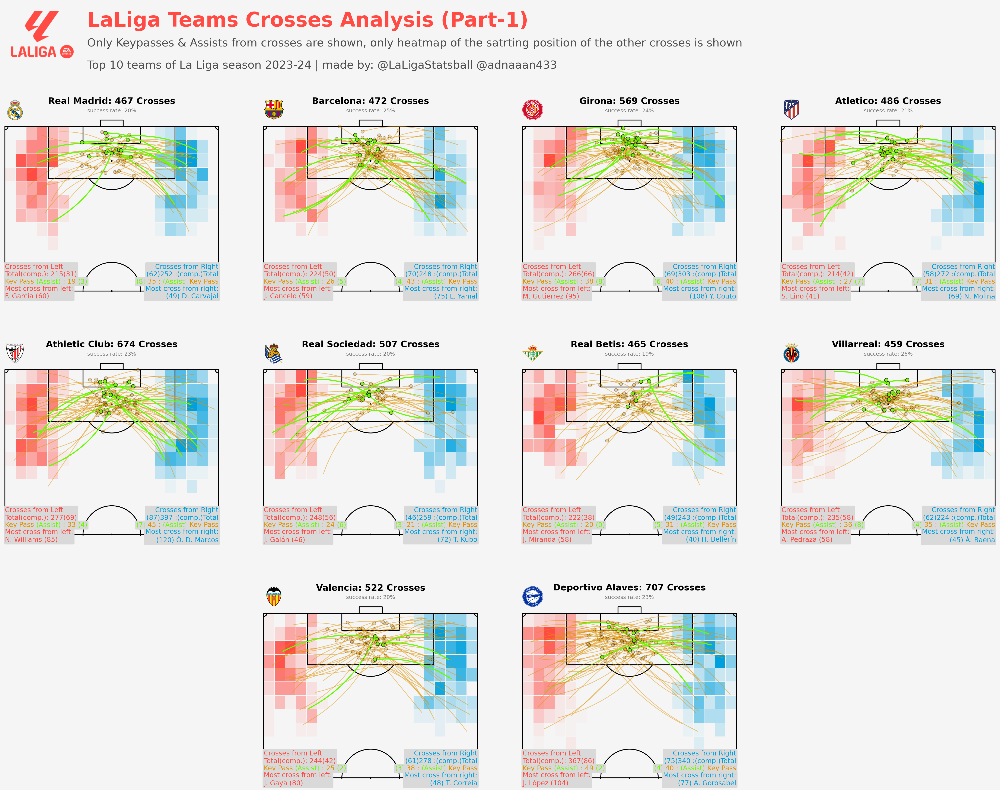

In [18]:
start_time = time.time()
fig, axs = plt.subplots(3, 4, figsize=(40, 28), facecolor='#f5f5f5', dpi=150)
axs = axs.flatten()

# List of team names
team_names = ['Real Madrid', 'Barcelona', 'Girona', 'Atletico', 'Athletic Club', 'Real Sociedad', 'Real Betis', 'Villarreal']

for i, team_name in enumerate(team_names):
    plot_crosses(axs[i], team_name)

plot_blank(axs[8])
plot_crosses(axs[9], 'Valencia')
plot_crosses(axs[10], 'Deportivo Alaves')
plot_blank(axs[11])

fig.text(0.19, 0.97, 'LaLiga Teams Crosses Analysis (Part-1)', color='#ff4b44', fontweight='bold', fontsize=45, ha='left', va='center')
fig.text(0.19, 0.945, 'Only Keypasses & Assists from crosses are shown, only heatmap of the satrting position of the other crosses is shown', 
         color='#505050', fontsize=25, ha='left', va='center')
fig.text(0.19, 0.92, 'Top 10 teams of La Liga season 2023-24 | made by: @LaLigaStatsball @adnaaan433', 
         color='#505050', fontsize=25, ha='left', va='center')

image_url = 'https://raw.githubusercontent.com/adnaaan433/league_logos/main/LaLiga.png'
image = urlopen(image_url)
image = Image.open(image)
ax_image = add_image(image, fig, left=0.12, bottom=0.92, width=0.07, height=0.07)



# plt.tight_layout()
end_time = time.time()
execution_time = end_time - start_time

print(f"Execution Time: {execution_time} seconds")

Execution Time: 23.349592924118042 seconds


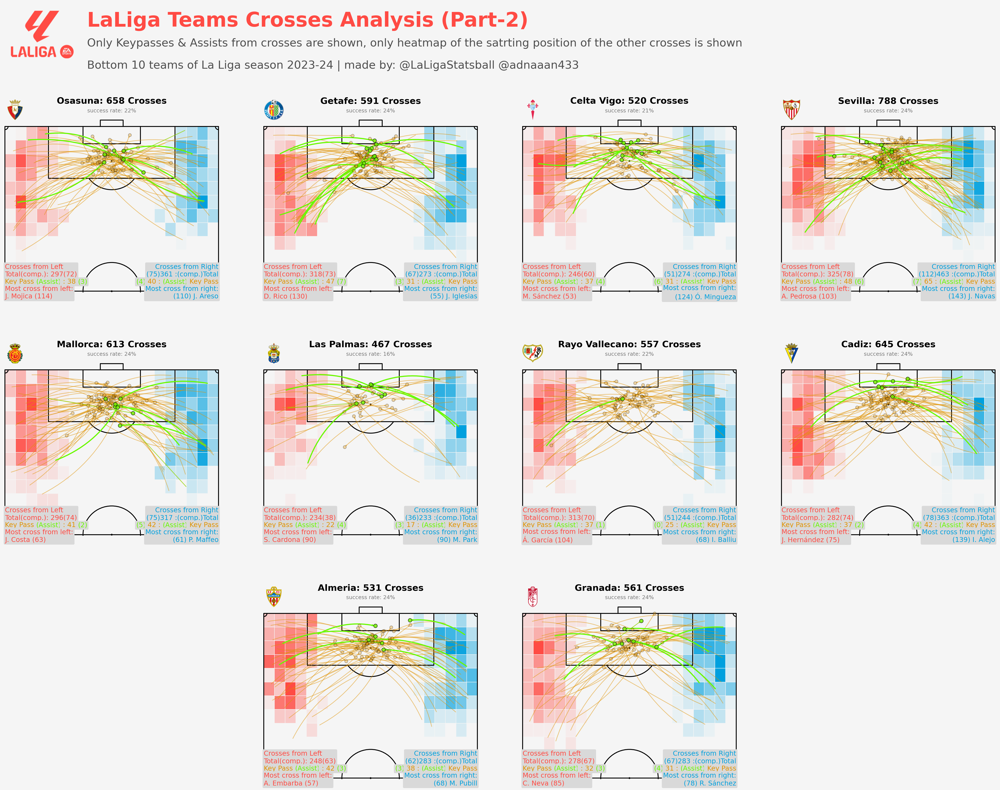

In [19]:
start_time = time.time()
fig, axs = plt.subplots(3, 4, figsize=(40, 28), facecolor='#f5f5f5', dpi=150)
axs = axs.flatten()

# List of team names
team_names = ['Osasuna', 'Getafe', 'Celta Vigo', 'Sevilla', 'Mallorca', 'Las Palmas', 
              'Rayo Vallecano', 'Cadiz']

for i, team_name in enumerate(team_names):
    plot_crosses(axs[i], team_name)

plot_blank(axs[8])
plot_crosses(axs[9], 'Almeria')
plot_crosses(axs[10], 'Granada')
plot_blank(axs[11])

fig.text(0.19, 0.97, 'LaLiga Teams Crosses Analysis (Part-2)', color='#ff4b44', fontweight='bold', fontsize=45, ha='left', va='center')
fig.text(0.19, 0.945, 'Only Keypasses & Assists from crosses are shown, only heatmap of the satrting position of the other crosses is shown', 
         color='#505050', fontsize=25, ha='left', va='center')
fig.text(0.19, 0.92, 'Bottom 10 teams of La Liga season 2023-24 | made by: @LaLigaStatsball @adnaaan433', 
         color='#505050', fontsize=25, ha='left', va='center')

image_url = 'https://raw.githubusercontent.com/adnaaan433/league_logos/main/LaLiga.png'
image = urlopen(image_url)
image = Image.open(image)
ax_image = add_image(image, fig, left=0.12, bottom=0.92, width=0.07, height=0.07)



# plt.tight_layout()
end_time = time.time()
execution_time = end_time - start_time

print(f"Execution Time: {execution_time} seconds")

# Against

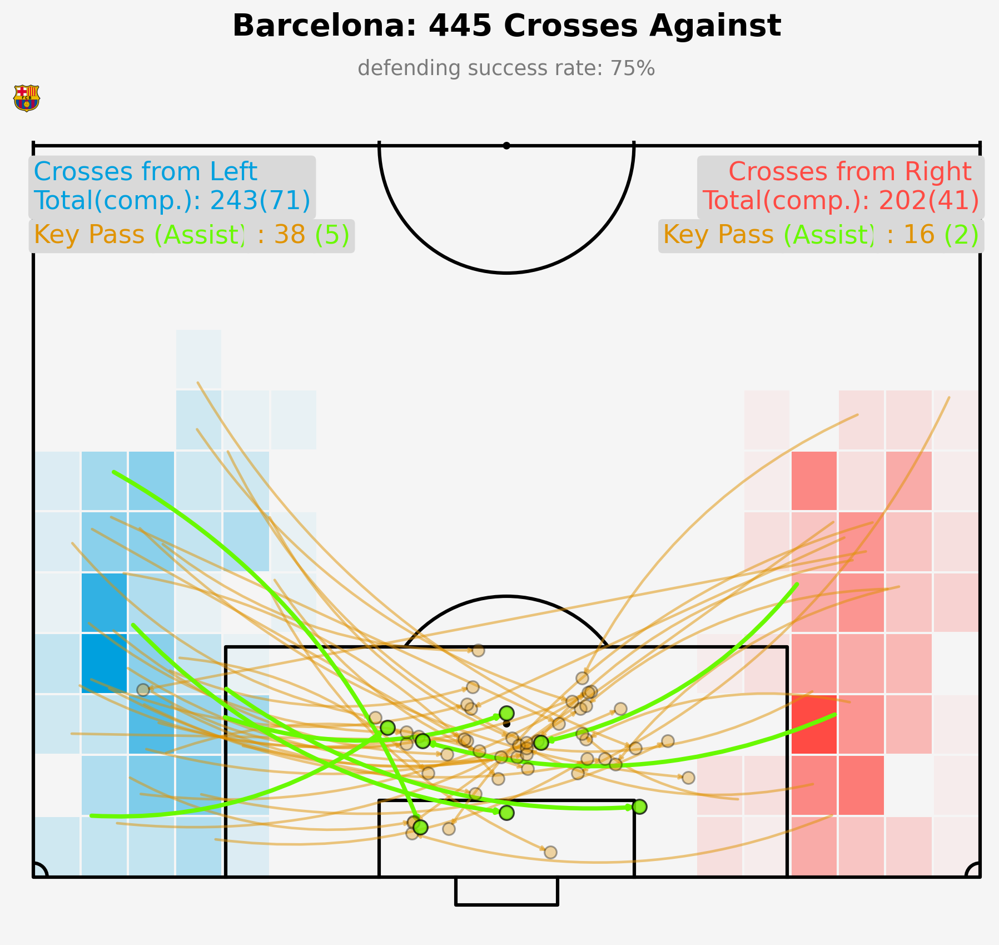

Execution Time: 1.2359278202056885 seconds


In [28]:
def plot_crosses_against(ax, teamName):
    pitch = VerticalPitch(pitch_type='uefa', line_color='black', pitch_color='#f5f5f5', corner_arcs=True, line_zorder=2,  linewidth=2, goal_type='box')
    pitch.draw(ax=ax)
    
    ax.set_ylim(52.15)
    ax.set_xlim(-0.35, 68.35)

    pearl_earring_cmap_left = LinearSegmentedColormap.from_list("Pearl Earring - 10 colors", ['#f5f5f5', '#ff4b44'], N=40)
    pearl_earring_cmap_right = LinearSegmentedColormap.from_list("Pearl Earring - 10 colors", ['#f5f5f5', '#00a0de'], N=40)
    
    df_cross = df[(df['oppositionTeamName']==teamName) & (df['type']=='Pass') & 
                  (df['qualifiers'].str.contains('Cross')) & (~df['qualifiers'].str.contains('CornerTaken'))]
    df_kp = df_cross[df_cross['qualifiers'].str.contains('KeyPass')]
    df_as = df_cross[df_cross['qualifiers'].str.contains('IntentionalGoalAssist')]
    df_left = df_cross[df_cross['y']>34]
    df_right = df_cross[df_cross['y']<34]
    left_comp = df_left[df_left['outcomeType']=='Successful']
    right_comp = df_right[df_right['outcomeType']=='Successful']
    left_kp = df_left[df_left['qualifiers'].str.contains('KeyPass')]
    right_kp = df_right[df_right['qualifiers'].str.contains('KeyPass')]
    left_as = df_left[df_left['qualifiers'].str.contains('IntentionalGoalAssist')]
    right_as = df_right[df_right['qualifiers'].str.contains('IntentionalGoalAssist')]
    success_rate = round(((len(left_comp)+len(right_comp))/(len(df_cross))),4)*100
    success_rate = 100 - success_rate 
    # Compute bin statistics and mask zeros
    bin_statistic_left = pitch.bin_statistic(df_left.x, df_left.y, bins=(24, 20), statistic='count', normalize=True)
    bin_statistic_left['statistic'] = np.where(bin_statistic_left['statistic'] == 0, np.nan, bin_statistic_left['statistic'])

    bin_statistic_right = pitch.bin_statistic(df_right.x, df_right.y, bins=(24, 20), statistic='count', normalize=True)
    bin_statistic_right['statistic'] = np.where(bin_statistic_right['statistic'] == 0, np.nan, bin_statistic_right['statistic'])

    # Plot heatmaps
    pitch.heatmap(bin_statistic_left, ax=ax, cmap=pearl_earring_cmap_left, edgecolors='#f5f5f5', lw=0.72)
    pitch.heatmap(bin_statistic_right, ax=ax, cmap=pearl_earring_cmap_right, edgecolors='#f5f5f5', lw=0.72)
    
    # lines_all = pitch.lines(df_cross.x, df_cross.y, df_cross.endX, df_cross.endY, lw=3.5, transparent=True, comet=True, color='gray', ax=ax, alpha=0.1)
    for idx, row in df_kp.iterrows():
        if 'RightFoot' in row['qualifiers']:
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#e09302', zorder=2, mutation_scale=5, alpha=0.5, linewidth=1.5, connectionstyle='arc3,rad=0.18')
            ax.add_patch(arrow)
        if 'LeftFoot' in row['qualifiers']:
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#e09302', zorder=2, mutation_scale=5, alpha=0.5, linewidth=1.5, connectionstyle='arc3,rad=-0.18')
            ax.add_patch(arrow)
        if (('RightFoot' not in row['qualifiers']) & ('LeftFoot' not in row['qualifiers'])):
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#e09302', zorder=2, mutation_scale=5, alpha=0.5, linewidth=1.5)
            ax.add_patch(arrow)

    for idx, row in df_as.iterrows():
        if 'RightFoot' in row['qualifiers']:
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#69f900', zorder=2, mutation_scale=5, alpha=1, linewidth=2.5, connectionstyle='arc3,rad=0.18')
            ax.add_patch(arrow)
        if 'LeftFoot' in row['qualifiers']:
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#69f900', zorder=2, mutation_scale=5, alpha=1, linewidth=2.5, connectionstyle='arc3,rad=-0.18')
            ax.add_patch(arrow)
        if (('RightFoot' not in row['qualifiers']) & ('LeftFoot' not in row['qualifiers'])) :
            arrow = patches.FancyArrowPatch((row['y'], row['x']), (row['endY'], row['endX']), arrowstyle='->',
                                        color='#69f900', zorder=2, mutation_scale=5, alpha=0.5, linewidth=1.5)
            ax.add_patch(arrow)
            
    # lines_kp = pitch.lines(df_kp.x, df_kp.y, df_kp.endX, df_kp.endY, lw=2.5, transparent=True, comet=True, color='#e09302', ax=ax, alpha=0.35)
    # lines_as = pitch.lines(df_as.x, df_as.y, df_as.endX, df_as.endY, lw=3.5, transparent=True, comet=True, color='#69f900', ax=ax, alpha=1, connectionstyle="arc3,rad=0.25")
    # sc1 = ax.scatter(df_cross.endY, df_cross.endX, s=20, color='gray', ec='black', lw=0.5, alpha=0.1, zorder=2)
    sc2 = ax.scatter(df_kp.endY, df_kp.endX, s=50, color='#e09302', ec='black', alpha=0.35, lw=1, zorder=2)
    sc3 = ax.scatter(df_as.endY, df_as.endX, s=70, color='#69f900', ec='black', alpha=0.75, lw=1, zorder=2)

    ax.text(68, 55.5, f"Crosses from Right \nTotal(comp.): {len(df_left)}({len(left_comp)})", color='#ff4b44', fontsize=15, va='center', ha='right', 
            bbox=dict(facecolor='#d9d9d9', edgecolor='None', boxstyle='round,pad=0.19'))
    ax.text(0, 55.5, f"Crosses from Left\nTotal(comp.): {len(df_right)}({len(right_comp)})", color='#00a0de', fontsize=15, va='center', ha='left',
           bbox=dict(facecolor='#d9d9d9', edgecolor='None', boxstyle='round,pad=0.19'))
    highlight_text = [{'color':'#69f900'}, {'color':'#69f900'}]
    ax_text(68, 59, f"Key Pass <(Assist)> : {len(left_kp)} <({len(left_as)})>", color='#e09302', fontsize=15, va='center', ha='right',
            bbox=dict(facecolor='#d9d9d9', edgecolor='None', boxstyle='round,pad=0.175'), highlight_textprops=highlight_text, ax=ax)
    ax_text(0, 59, f"Key Pass <(Assist)> : {len(right_kp)} <({len(right_as)})>", color='#e09302', fontsize=15, va='center', ha='left', 
            bbox=dict(facecolor='#d9d9d9', edgecolor='None', boxstyle='round,pad=0.175'), highlight_textprops=highlight_text, ax=ax)
    
    ax.text(34, 44, f"{teamName}: {len(df_cross)} Crosses Against", color='black', fontsize=18, fontweight='bold', va='center', ha='center')
    ax.text(34, 47, f"defending success rate: {round(success_rate)}%", color='k', fontsize=12, alpha=0.5, va='center', ha='center')
    
    # Take data coordinates and transform them to normalized figure coordinates
    DC_to_FC = ax.transData.transform
    FC_to_NFC = fig.transFigure.inverted().transform
    DC_to_NFC = lambda x: FC_to_NFC(DC_to_FC(x))
    ax_coords = DC_to_NFC((-1.5,111))
    ax_size = 0.023
    image_ax = fig.add_axes([ax_coords[0], ax_coords[1], ax_size, ax_size], fc='None', anchor='C')
    fotmob_url = f'https://raw.githubusercontent.com/adnaaan433/club_teams_logos/main/{teamName}.png'
    fotmob_url = fotmob_url.replace(' ', '%20')
    club_icon = Image.open(urllib.request.urlopen(fotmob_url))
    image_ax.imshow(club_icon)
    image_ax.axis('off')
    
    ax.invert_yaxis()
    
    return 

# Measure the execution time
start_time = time.time()
fig, ax = plt.subplots(facecolor='#f5f5f5', figsize=(10,10), dpi=222)
plot_crosses_against(ax, 'Barcelona')
end_time = time.time()
execution_time = end_time - start_time
plt.show()
print(f"Execution Time: {execution_time} seconds")

Execution Time: 18.951159477233887 seconds


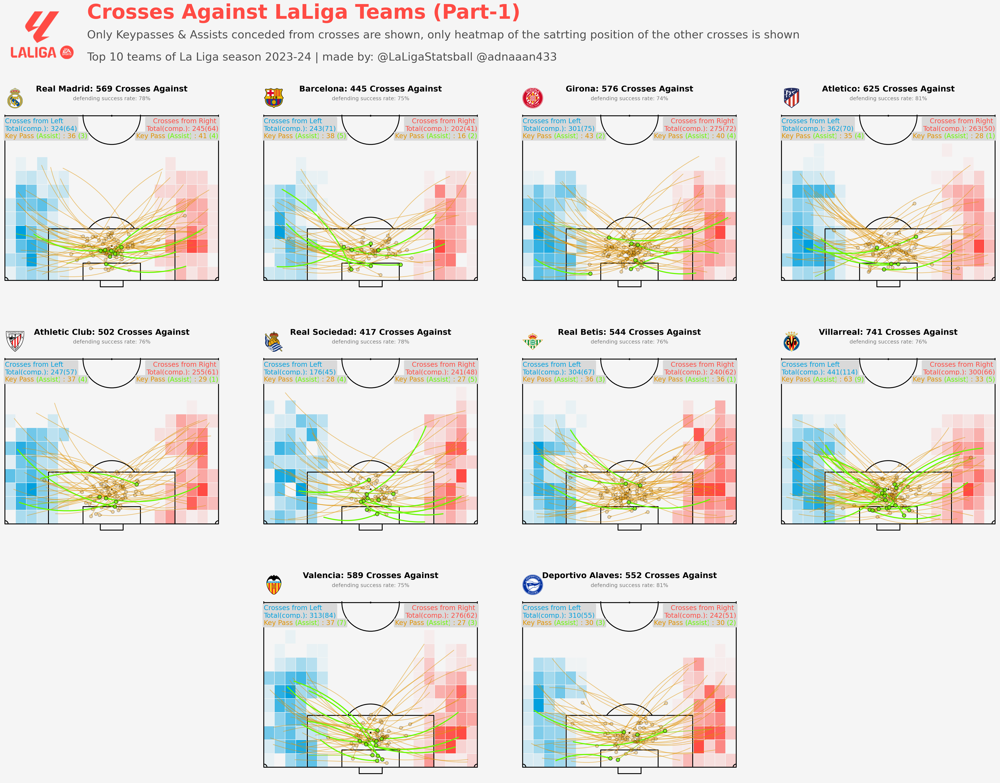

In [30]:
start_time = time.time()
fig, axs = plt.subplots(3, 4, figsize=(40, 28), facecolor='#f5f5f5', dpi=150)
axs = axs.flatten()

# List of team names
team_names = ['Real Madrid', 'Barcelona', 'Girona', 'Atletico', 'Athletic Club', 'Real Sociedad', 'Real Betis', 'Villarreal']

for i, team_name in enumerate(team_names):
    plot_crosses_against(axs[i], team_name)

plot_blank(axs[8])
plot_crosses_against(axs[9], 'Valencia')
plot_crosses_against(axs[10], 'Deportivo Alaves')
plot_blank(axs[11])

fig.text(0.19, 0.98, 'Crosses Against LaLiga Teams (Part-1)', color='#ff4b44', fontweight='bold', fontsize=45, ha='left', va='center')
fig.text(0.19, 0.955, 'Only Keypasses & Assists conceded from crosses are shown, only heatmap of the satrting position of the other crosses is shown', 
         color='#505050', fontsize=25, ha='left', va='center')
fig.text(0.19, 0.93, 'Top 10 teams of La Liga season 2023-24 | made by: @LaLigaStatsball @adnaaan433', 
         color='#505050', fontsize=25, ha='left', va='center')

image_url = 'https://raw.githubusercontent.com/adnaaan433/league_logos/main/LaLiga.png'
image = urlopen(image_url)
image = Image.open(image)
ax_image = add_image(image, fig, left=0.12, bottom=0.92, width=0.07, height=0.07)



# plt.tight_layout()
end_time = time.time()
execution_time = end_time - start_time

print(f"Execution Time: {execution_time} seconds")

Execution Time: 20.16601276397705 seconds


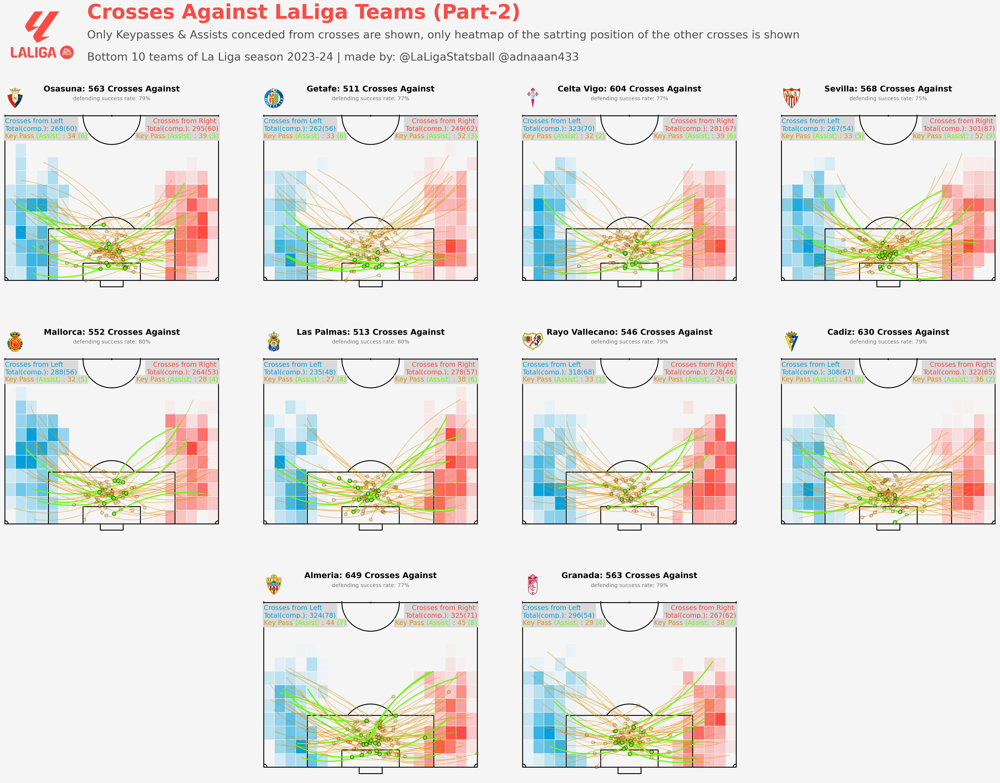

In [32]:
start_time = time.time()
fig, axs = plt.subplots(3, 4, figsize=(40, 28), facecolor='#f5f5f5', dpi=150)
axs = axs.flatten()

# List of team names
team_names = ['Osasuna', 'Getafe', 'Celta Vigo', 'Sevilla', 'Mallorca', 'Las Palmas', 
              'Rayo Vallecano', 'Cadiz']

for i, team_name in enumerate(team_names):
    plot_crosses_against(axs[i], team_name)

plot_blank(axs[8])
plot_crosses_against(axs[9], 'Almeria')
plot_crosses_against(axs[10], 'Granada')
plot_blank(axs[11])

fig.text(0.19, 0.98, 'Crosses Against LaLiga Teams (Part-2)', color='#ff4b44', fontweight='bold', fontsize=45, ha='left', va='center')
fig.text(0.19, 0.955, 'Only Keypasses & Assists conceded from crosses are shown, only heatmap of the satrting position of the other crosses is shown', 
         color='#505050', fontsize=25, ha='left', va='center')
fig.text(0.19, 0.93, 'Bottom 10 teams of La Liga season 2023-24 | made by: @LaLigaStatsball @adnaaan433', 
         color='#505050', fontsize=25, ha='left', va='center')

image_url = 'https://raw.githubusercontent.com/adnaaan433/league_logos/main/LaLiga.png'
image = urlopen(image_url)
image = Image.open(image)
ax_image = add_image(image, fig, left=0.12, bottom=0.92, width=0.07, height=0.07)



# plt.tight_layout()
end_time = time.time()
execution_time = end_time - start_time

print(f"Execution Time: {execution_time} seconds")